# Controlling oscillations in Parkinson’s disease

#### Semestral project for the course *"Introduction to Computational Neuroscience I*" at the Charles University, Winter 2025.



##### Emma Tekulová

 https://nest-simulator.readthedocs.io/en/v2.18.0/getting_started.html

## Model Overview

This notebook implements a simplified model focusing on:
- **STN (Subthalamic Nucleus)**: 300 excitatory neurons
- **GPe (Globus Pallidus external)**: 500 inhibitory neurons

### Experimental Protocol:
1. **Baseline** (0-1000ms): Normal activity
2. **Parkinsonian state** (1000-2000ms): Increased inhibition to GPe - Parkinson's disease simulation
3. **DBS treatment** (2000-3000ms): Deep brain stimulation applied

In [19]:
import nest
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

# Configure matplotlib for better plots
plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams["font.size"] = 11

## Network Setup and Configuration

### Neural Population Parameters

In [20]:
def setup_network():
    """
    Create STN-GPe network with physiologically realistic connectivity.

    Returns:
        tuple: (stn_population, gpe_population) - NEST node collections
    """
    nest.ResetKernel()
    nest.SetKernelStatus({"resolution": 0.1})

    neuron_params = {
        "C_m": 30.0,  # Membrane capacity (pF)
        "E_L": -70.0,  # Leak reversal potential (mV)
        "V_reset": -70.0,  # Reset potential (mV)
        "V_th": -60.0,  # Spike threshold (mV)
        "t_ref": 2.0,  # Refractory period (ms)
        "tau_m": 20.0,  # Membrane time constant (ms)
        "tau_syn_ex": 1.0,  # Excitatory synapse time constant (ms)
        "tau_syn_in": 10.0,  # Inhibitory synapse time constant (ms)
    }

    # Create populations
    stn_pop = nest.Create("iaf_psc_alpha", 300, params=neuron_params)  # Excitatory
    gpe_pop = nest.Create("iaf_psc_alpha", 500, params=neuron_params)  # Inhibitory

    # Define connectivity patterns
    connections = [
        # (source, target, connection_spec, synapse_spec, description)
        (
            gpe_pop,
            stn_pop,
            {"rule": "fixed_indegree", "indegree": 30},
            {"weight": -15.0, "delay": 5.0},
            "GPe → STN (inhibitory)",
        ),
        (
            stn_pop,
            gpe_pop,
            {"rule": "fixed_indegree", "indegree": 50},
            {"weight": 30.0, "delay": 5.0},
            "STN → GPe (excitatory)",
        ),
        (
            gpe_pop,
            gpe_pop,
            {"rule": "fixed_indegree", "indegree": 30},
            {"weight": -5.0, "delay": 2.0},
            "GPe → GPe (recurrent inhibition)",
        ),
        (
            stn_pop,
            stn_pop,
            {"rule": "fixed_indegree", "indegree": 50},
            {"weight": 50.0, "delay": 2.0},
            "STN → STN (recurrent excitation)",
        ),
    ]

    # Create all connections
    for source, target, conn_spec, syn_spec, _ in connections:
        nest.Connect(source, target, conn_spec=conn_spec, syn_spec=syn_spec)

    return stn_pop, gpe_pop


def add_background_noise(stn_pop, gpe_pop, rate=800.0):
    """
    Args:
        stn_pop, gpe_pop: NEST populations
        rate: Poisson firing rate (Hz)

    Returns:
        poisson_generator: NEST noise source
    """
    poisson_noise = nest.Create("poisson_generator", params={"rate": rate})
    nest.Connect(poisson_noise, gpe_pop, syn_spec={"weight": 40.0})  # pA
    nest.Connect(poisson_noise, stn_pop, syn_spec={"weight": 65.0})  # pA
    return poisson_noise


def setup_recording(stn_pop, gpe_pop):
    spike_det_stn = nest.Create("spike_recorder")
    spike_det_gpe = nest.Create("spike_recorder")
    nest.Connect(stn_pop, spike_det_stn)
    nest.Connect(gpe_pop, spike_det_gpe)
    return spike_det_stn, spike_det_gpe


## 1. Baseline Simulation

Normal healthy state with background Poisson noise (800 Hz).


Dec 11 14:52:48 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 14:52:48 NodeManager::prepare_nodes [Info]: 
    Preparing 803 nodes for simulation.

Dec 11 14:52:48 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 803
    Simulation time (ms): 1000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 14:52:48 SimulationManager::run [Info]: 
    Simulation finished.


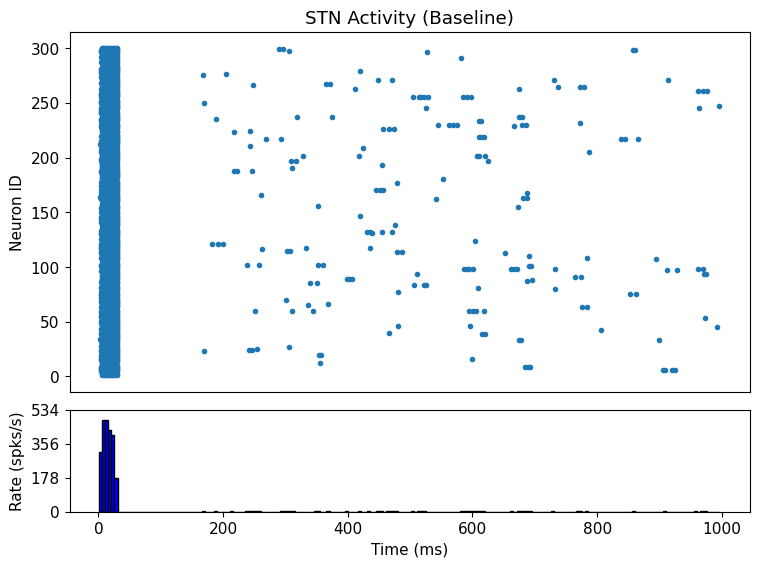

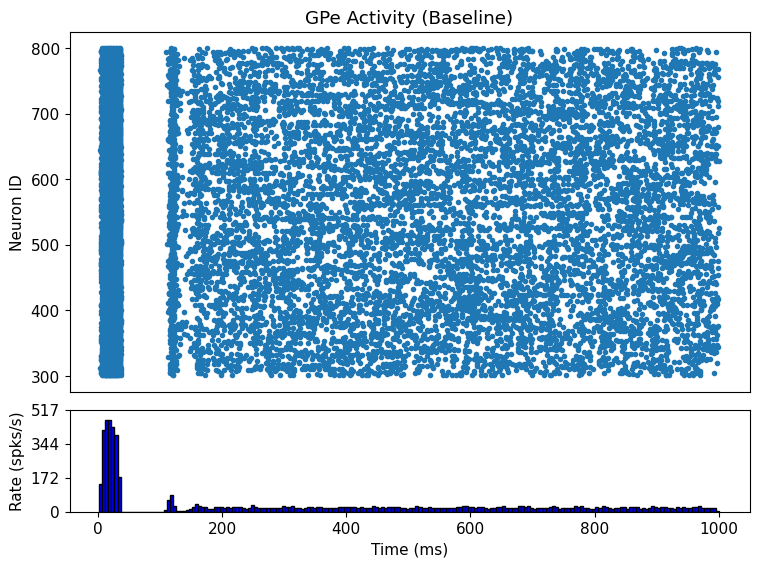

(NodeCollection(metadata=None, model=spike_recorder, size=1, first=802),
 NodeCollection(metadata=None, model=spike_recorder, size=1, first=803))

In [21]:
def run_baseline_simulation(sim_time=1000.0):
    stn_pop, gpe_pop = setup_network()
    add_background_noise(stn_pop, gpe_pop)
    spike_det_stn, spike_det_gpe = setup_recording(stn_pop, gpe_pop)

    nest.Simulate(sim_time)
    nest.raster_plot.from_device(
        spike_det_stn, hist=True, title="STN Activity (Baseline)"
    )
    plt.show()

    nest.raster_plot.from_device(
        spike_det_gpe, hist=True, title="GPe Activity (Baseline)"
    )
    plt.show()

    return spike_det_stn, spike_det_gpe


run_baseline_simulation()

## 2. Parkinsonian State Simulation

Models the pathological state by applying additional inhibition to GPe neurons.


Dec 11 14:52:49 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 14:52:49 NodeManager::prepare_nodes [Info]: 
    Preparing 804 nodes for simulation.

Dec 11 14:52:49 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 804
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 14:52:50 SimulationManager::run [Info]: 
    Simulation finished.


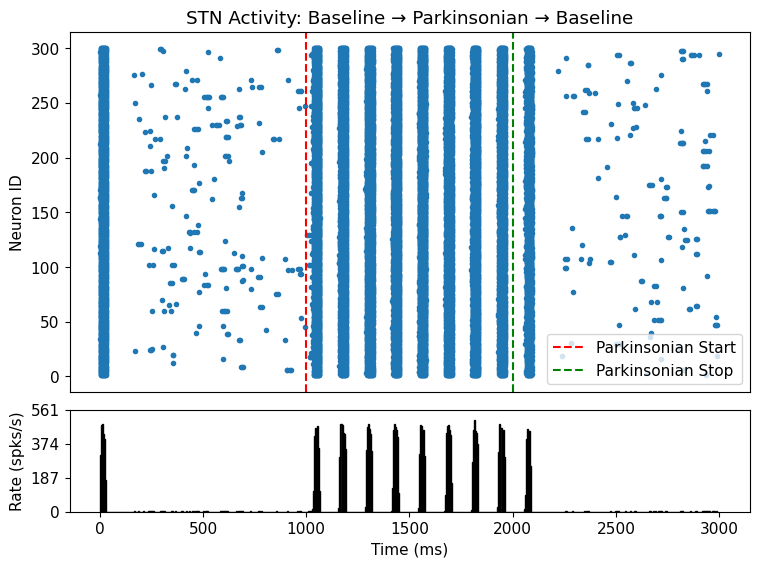

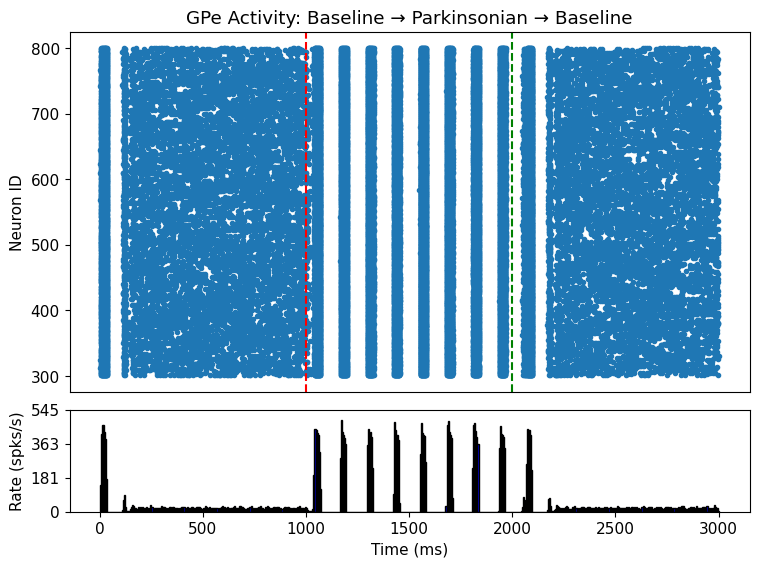

(NodeCollection(metadata=None, model=spike_recorder, size=1, first=803),
 NodeCollection(metadata=None, model=spike_recorder, size=1, first=804))

In [22]:
def run_parkinsonian_simulation(sim_time=3000.0, pd_start=1000.0, pd_stop=2000.0):
    stn_pop, gpe_pop = setup_network()
    add_background_noise(stn_pop, gpe_pop)

    # Add extra inhibition to GPe
    gpe_extra_inhib = nest.Create(
        "poisson_generator", params={"rate": 800.0, "start": pd_start, "stop": pd_stop}
    )
    nest.Connect(
        gpe_extra_inhib, gpe_pop, syn_spec={"weight": -5.0}
    )  # Additional inhibition (pA)

    spike_stn, spike_gpe = setup_recording(stn_pop, gpe_pop)

    nest.Simulate(sim_time)

    nest.raster_plot.from_device(
        spike_stn, hist=True, title="STN Activity: Baseline → Parkinsonian → Baseline"
    )
    plt.axvline(x=pd_start, color="r", linestyle="--", label="Parkinsonian Start")
    plt.axvline(x=pd_stop, color="g", linestyle="--", label="Parkinsonian Stop")
    plt.legend()
    plt.show()

    nest.raster_plot.from_device(
        spike_gpe, hist=True, title="GPe Activity: Baseline → Parkinsonian → Baseline"
    )
    plt.axvline(x=pd_start, color="r", linestyle="--")
    plt.axvline(x=pd_stop, color="g", linestyle="--")
    plt.show()

    return spike_stn, spike_gpe


run_parkinsonian_simulation()


## 3. Deep Brain Stimulation (DBS) Treatment


Dec 11 14:54:29 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 14:54:29 NodeManager::prepare_nodes [Info]: 
    Preparing 805 nodes for simulation.

Dec 11 14:54:29 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 805
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 14:54:30 SimulationManager::run [Info]: 
    Simulation finished.


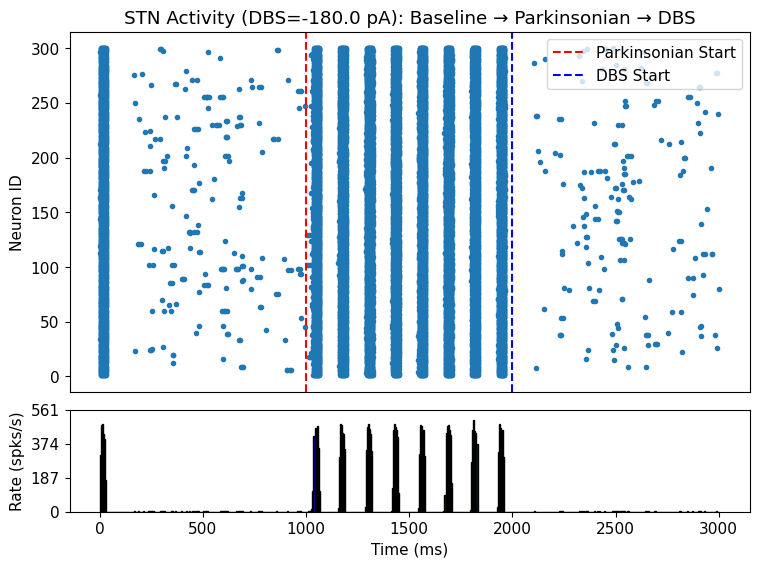

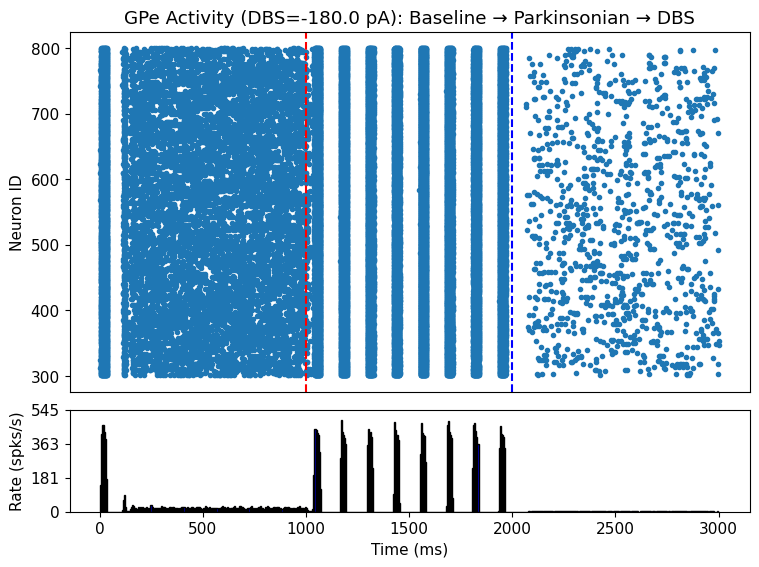

In [27]:
def run_dbs_simulation(
    amplitude=-180.0, sim_time=3000.0, pd_start=1000.0, dbs_start=2000.0
):
    """
    Run complete simulation: Baseline → Parkinsonian → DBS treatment.

    Arg:
        amplitude: DBS current amplitude (pA, negative = hyperpolarizing)

    Returns:
        tuple: (stn_recorder, gpe_recorder) - NEST spike recorders
    """
    stn_pop, gpe_pop = setup_network()
    add_background_noise(stn_pop, gpe_pop)

    # Parkinsonian state: extra inhibition to GPe from pd_start onwards
    gpe_extra_inhib = nest.Create(
        "poisson_generator",
        params={"rate": 800.0, "start": pd_start, "stop": sim_time},
    )
    nest.Connect(gpe_extra_inhib, gpe_pop, syn_spec={"weight": -5.0})

    # DBS: DC current to STN
    dbs_generator = nest.Create(
        "dc_generator",
        params={"amplitude": amplitude, "start": dbs_start, "stop": sim_time},
    )
    nest.Connect(dbs_generator, stn_pop)

    spike_stn, spike_gpe = setup_recording(stn_pop, gpe_pop)

    nest.Simulate(sim_time)

    return spike_stn, spike_gpe


def plot_dbs_results(
    spike_stn, spike_gpe, amplitude=-180.0, pd_start=1000.0, dbs_start=2000.0
):
    # STN Activity
    nest.raster_plot.from_device(
        spike_stn,
        hist=True,
        title=f"STN Activity (DBS={amplitude} pA): Baseline → Parkinsonian → DBS",
    )
    plt.axvline(x=pd_start, color="r", linestyle="--", label="Parkinsonian Start")
    plt.axvline(x=dbs_start, color="b", linestyle="--", label="DBS Start")
    plt.legend()
    plt.show()

    # GPe Activity
    nest.raster_plot.from_device(
        spike_gpe,
        hist=True,
        title=f"GPe Activity (DBS={amplitude} pA): Baseline → Parkinsonian → DBS",
    )
    plt.axvline(x=pd_start, color="r", linestyle="--")
    plt.axvline(x=dbs_start, color="b", linestyle="--")
    plt.show()


spike_stn, spike_gpe = run_dbs_simulation(amplitude=-180.0)
plot_dbs_results(spike_stn, spike_gpe, amplitude=-180.0)


## 4.Spectral Analysis

- **Spectrograms**
- **Power Spectral Density (PSD)**
- **Autocorrelation**

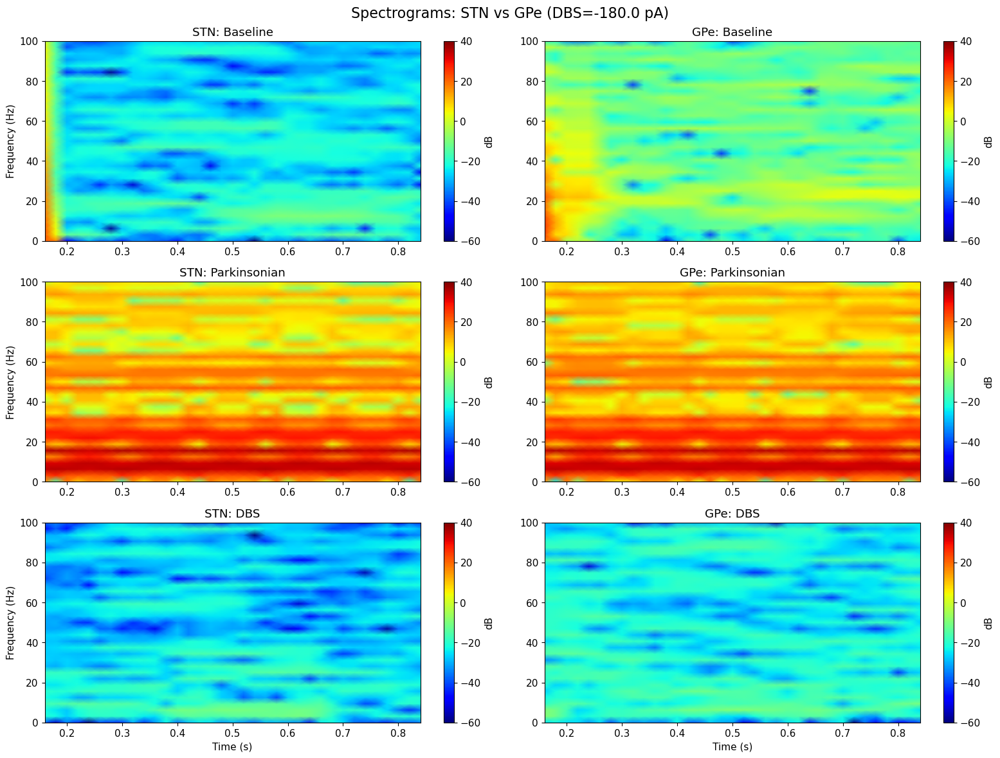

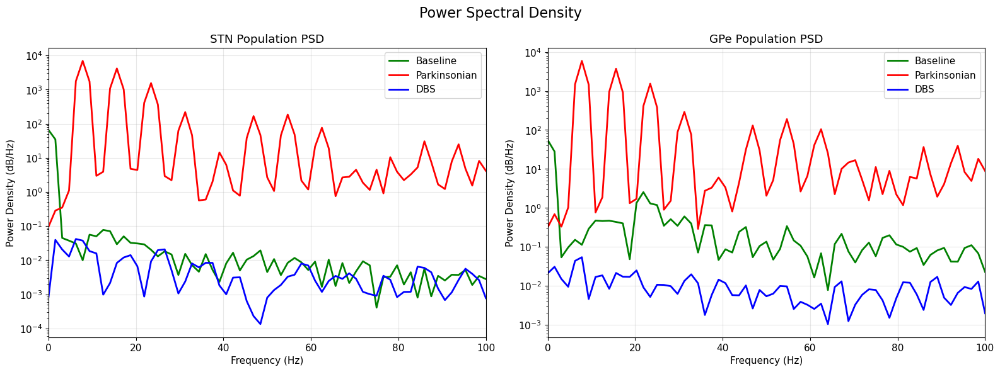

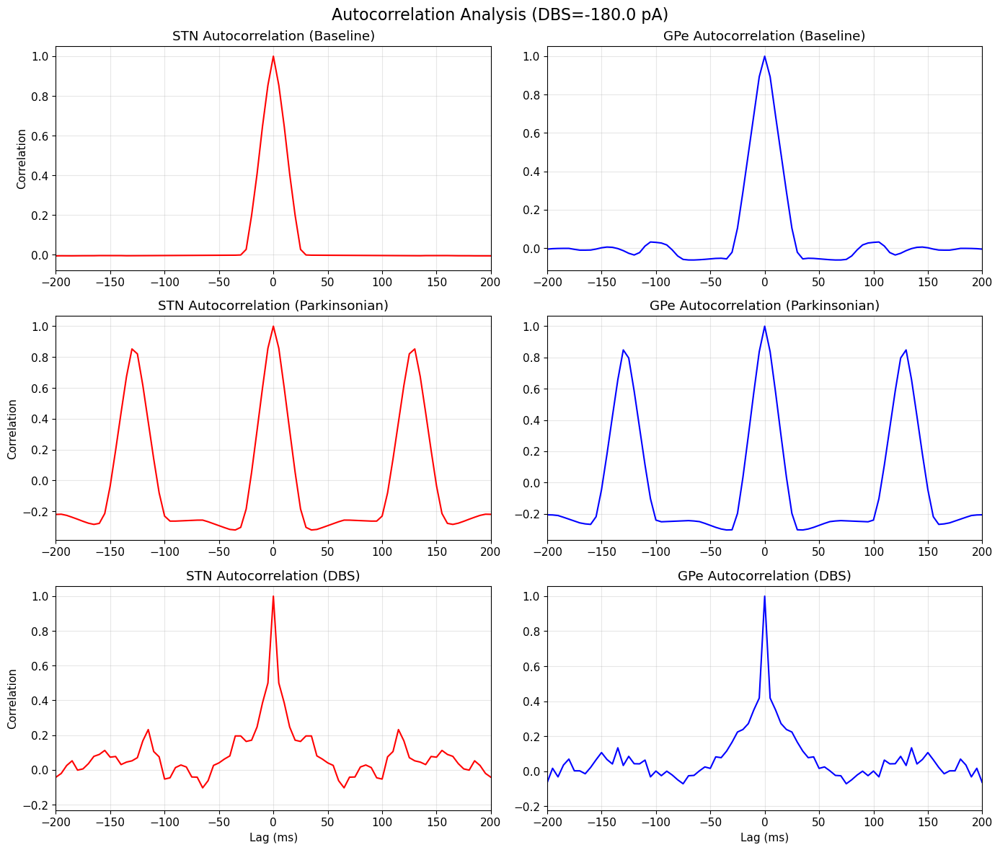

In [28]:
def get_population_rate(recorder, t_start, t_stop, bin_width=5.0, n_neurons=300):
    """
    Extract population firing rate from NEST spike recorder.

    bin_width: Bin size for rate calculation (ms)

    Returns:
        tuple: (time_bins, firing_rate_hz)
    """
    events = nest.GetStatus(recorder, "events")[0]
    spikes = events["times"]

    # Filter spikes for the time window
    mask = (spikes >= t_start) & (spikes < t_stop)
    spikes = spikes[mask]

    bins = np.arange(t_start, t_stop + bin_width, bin_width)
    counts, _ = np.histogram(spikes, bins)

    # Convert to firing rate (Hz per neuron)
    rate_hz = counts / ((bin_width / 1000.0) * n_neurons)

    return bins[:-1], rate_hz


def plot_spectrograms(spike_stn, spike_gpe, amplitude=-180.0):
    periods = {
        "Baseline": (0.0, 1000.0),
        "Parkinsonian": (1000.0, 2000.0),
        "DBS": (2000.0, 3000.0),
    }

    fs = 200.0  # Sampling frequency (Hz)
    vmin_db, vmax_db = -60.0, 40.0  # Fixed color scale (dB)

    fig, axes = plt.subplots(3, 2, figsize=(16, 12))
    title = f"Spectrograms: STN vs GPe (DBS={amplitude} pA)"
    fig.suptitle(title, fontsize=16)

    for row, (label, (start, stop)) in enumerate(periods.items()):
        # STN analysis
        _, rate_stn = get_population_rate(spike_stn, start, stop, n_neurons=300)
        rate_stn_centered = rate_stn - np.mean(rate_stn)

        f, t, Sxx = signal.spectrogram(
            rate_stn_centered, fs=fs, nperseg=64, noverlap=60
        )
        im1 = axes[row, 0].pcolormesh(
            t,
            f,
            10 * np.log10(Sxx + 1e-10),
            shading="gouraud",
            cmap="jet",
            vmin=vmin_db,
            vmax=vmax_db,
        )
        axes[row, 0].set_title(f"STN: {label}")
        axes[row, 0].set_ylabel("Frequency (Hz)")
        if row == 2:
            axes[row, 0].set_xlabel("Time (s)")
        fig.colorbar(im1, ax=axes[row, 0], label="dB")

        # GPe analysis
        _, rate_gpe = get_population_rate(spike_gpe, start, stop, n_neurons=500)
        rate_gpe_centered = rate_gpe - np.mean(rate_gpe)

        f, t, Sxx = signal.spectrogram(
            rate_gpe_centered, fs=fs, nperseg=64, noverlap=60
        )
        im2 = axes[row, 1].pcolormesh(
            t,
            f,
            10 * np.log10(Sxx + 1e-10),
            shading="gouraud",
            cmap="jet",
            vmin=vmin_db,
            vmax=vmax_db,
        )
        axes[row, 1].set_title(f"GPe: {label}")
        if row == 2:
            axes[row, 1].set_xlabel("Time (s)")
        fig.colorbar(im2, ax=axes[row, 1], label="dB")

    plt.tight_layout()
    plt.show()


def plot_psd_comparison(spike_stn, spike_gpe, amplitude=-180.0):
    periods = {
        "Baseline": (0.0, 1000.0, "green"),
        "Parkinsonian": (1000.0, 2000.0, "red"),
        "DBS": (2000.0, 3000.0, "blue"),
    }

    fs = 200.0
    nperseg = 128

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    title = "Power Spectral Density" + (
        f" (DBS={amplitude} pA)" if amplitude != -180.0 else ""
    )
    fig.suptitle(title, fontsize=16)

    for label, (start, stop, color) in periods.items():
        # STN PSD
        _, rate_stn = get_population_rate(spike_stn, start, stop, n_neurons=300)
        rate_stn_centered = rate_stn - np.mean(rate_stn)
        f_stn, psd_stn = signal.welch(rate_stn_centered, fs=fs, nperseg=nperseg)
        axes[0].semilogy(f_stn, psd_stn, label=label, color=color, linewidth=2)

        # GPe PSD
        _, rate_gpe = get_population_rate(spike_gpe, start, stop, n_neurons=500)
        rate_gpe_centered = rate_gpe - np.mean(rate_gpe)
        f_gpe, psd_gpe = signal.welch(rate_gpe_centered, fs=fs, nperseg=nperseg)
        axes[1].semilogy(f_gpe, psd_gpe, label=label, color=color, linewidth=2)

    for ax, title in zip(axes, ["STN Population PSD", "GPe Population PSD"]):
        ax.set_title(title)
        ax.set_xlabel("Frequency (Hz)")
        ax.set_ylabel("Power Density (dB/Hz)")
        ax.set_xlim(0, 100)
        ax.grid(True, alpha=0.3)
        ax.legend()

    plt.tight_layout()
    plt.show()


def plot_autocorrelation(spike_stn, spike_gpe, amplitude=-180.0):
    periods = {
        "Baseline": (0.0, 1000.0),
        "Parkinsonian": (1000.0, 2000.0),
        "DBS": (2000.0, 3000.0),
    }

    fig, axes = plt.subplots(3, 2, figsize=(14, 12))
    title = f"Autocorrelation Analysis (DBS={amplitude} pA)"
    fig.suptitle(title, fontsize=16)

    for row, (label, (start, stop)) in enumerate(periods.items()):
        # STN autocorrelation
        _, rate_stn = get_population_rate(spike_stn, start, stop, n_neurons=300)
        rate_stn_centered = rate_stn - np.mean(rate_stn)
        corr_stn = np.correlate(rate_stn_centered, rate_stn_centered, mode="full")
        corr_stn /= np.max(corr_stn)
        lags_stn = (
            signal.correlation_lags(len(rate_stn_centered), len(rate_stn_centered))
            * 5.0
        )

        axes[row, 0].plot(lags_stn, corr_stn, color="red")
        axes[row, 0].set_xlim(-200, 200)
        axes[row, 0].set_title(f"STN Autocorrelation ({label})")
        axes[row, 0].set_ylabel("Correlation")
        axes[row, 0].grid(True, alpha=0.3)

        # GPe autocorrelation
        _, rate_gpe = get_population_rate(spike_gpe, start, stop, n_neurons=500)
        rate_gpe_centered = rate_gpe - np.mean(rate_gpe)
        corr_gpe = np.correlate(rate_gpe_centered, rate_gpe_centered, mode="full")
        corr_gpe /= np.max(corr_gpe)
        lags_gpe = (
            signal.correlation_lags(len(rate_gpe_centered), len(rate_gpe_centered))
            * 5.0
        )

        axes[row, 1].plot(lags_gpe, corr_gpe, color="blue")
        axes[row, 1].set_xlim(-200, 200)
        axes[row, 1].set_title(f"GPe Autocorrelation ({label})")
        axes[row, 1].grid(True, alpha=0.3)

        if row == 2:
            axes[row, 0].set_xlabel("Lag (ms)")
            axes[row, 1].set_xlabel("Lag (ms)")

    plt.tight_layout()
    plt.show()


def complete_spectral_analysis(spike_stn, spike_gpe, amplitude=-180.0):
    plot_spectrograms(spike_stn, spike_gpe, amplitude)
    plot_psd_comparison(spike_stn, spike_gpe, amplitude)
    plot_autocorrelation(spike_stn, spike_gpe, amplitude)


complete_spectral_analysis(spike_stn, spike_gpe)

## 5. DBS amplitude exploration

Exploration of different DBS current amplitudes.

--- Testing amplitude: -200 pA ---

Dec 11 15:06:00 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 15:06:00 NodeManager::prepare_nodes [Info]: 
    Preparing 805 nodes for simulation.

Dec 11 15:06:00 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 805
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 15:06:01 SimulationManager::run [Info]: 
    Simulation finished.


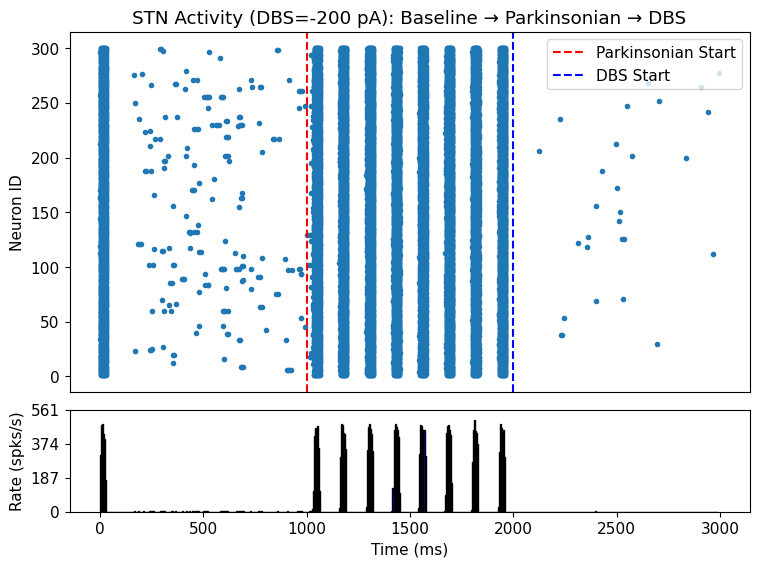

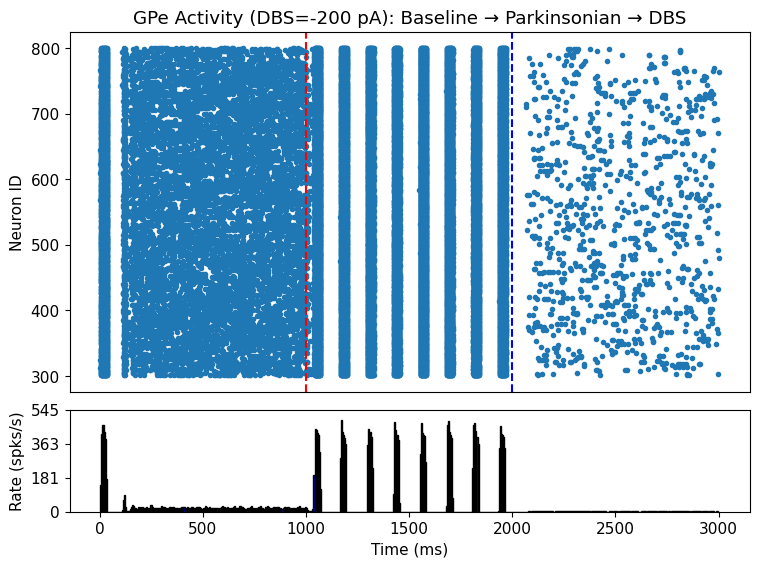


--- Testing amplitude: -180 pA ---

Dec 11 15:06:02 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 15:06:02 NodeManager::prepare_nodes [Info]: 
    Preparing 805 nodes for simulation.

Dec 11 15:06:02 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 805
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 15:06:03 SimulationManager::run [Info]: 
    Simulation finished.


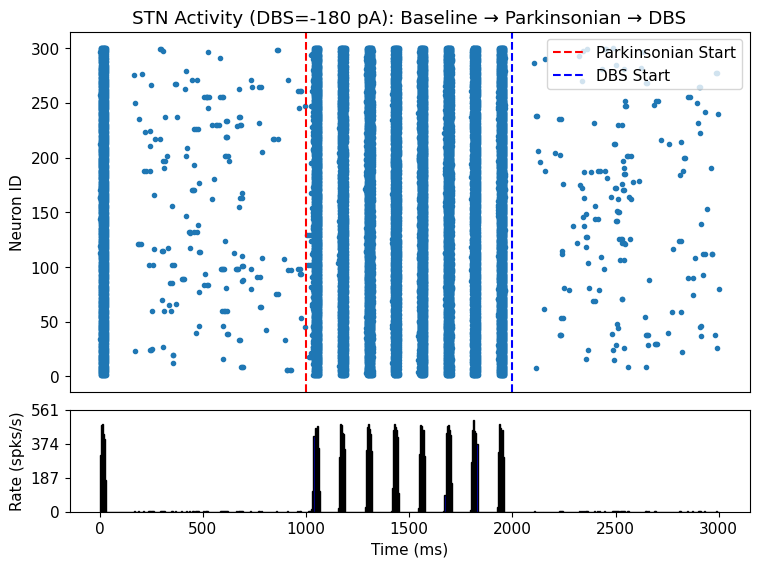

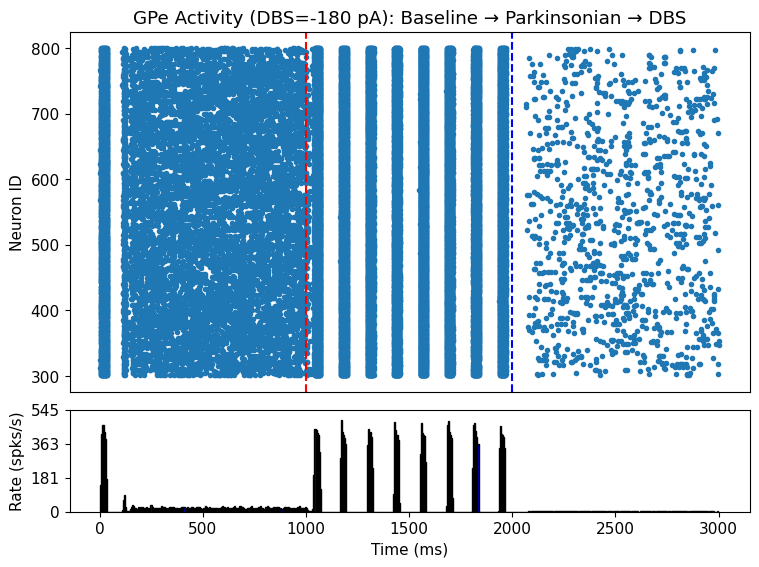


--- Testing amplitude: -90 pA ---

Dec 11 15:06:05 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 15:06:05 NodeManager::prepare_nodes [Info]: 
    Preparing 805 nodes for simulation.

Dec 11 15:06:05 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 805
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 15:06:06 SimulationManager::run [Info]: 
    Simulation finished.


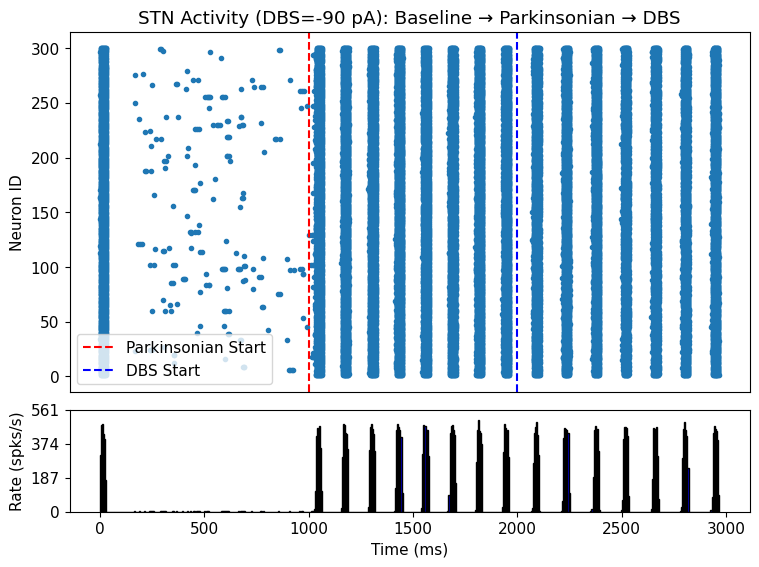

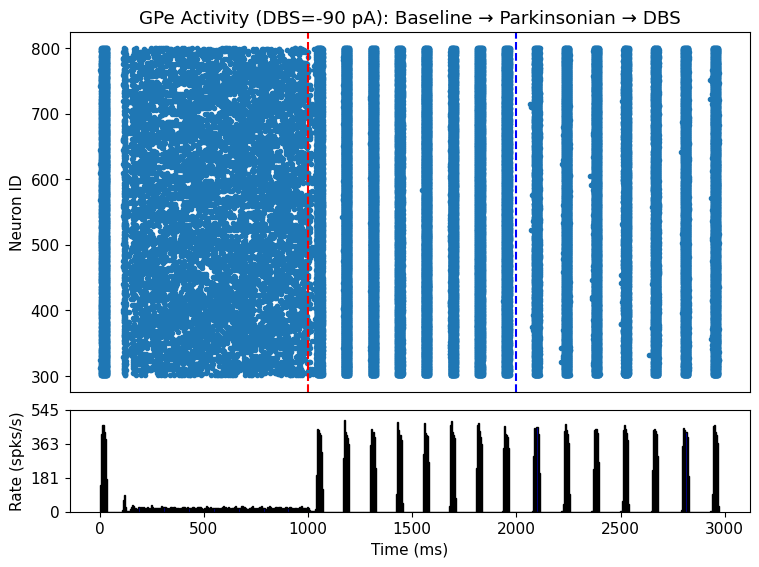

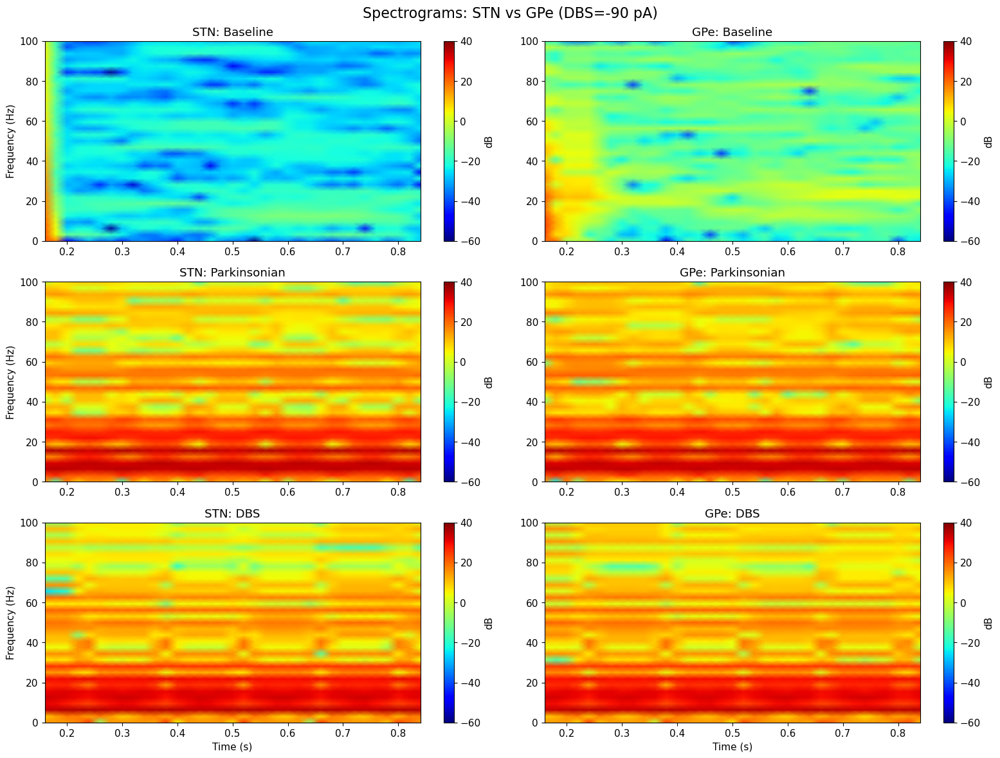

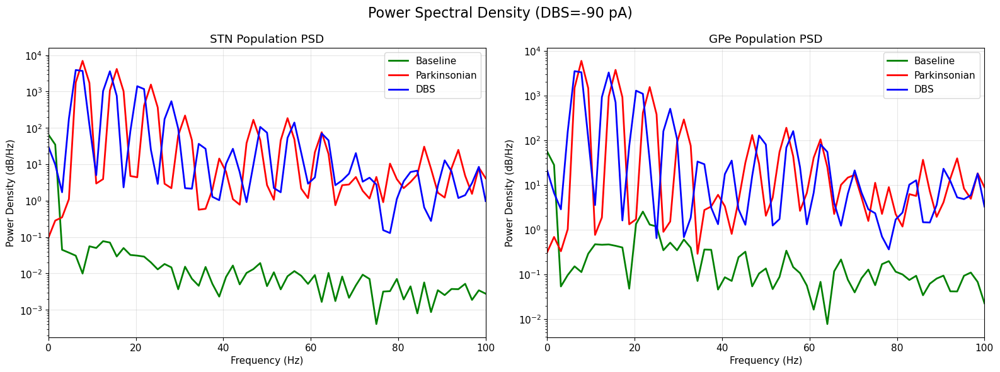

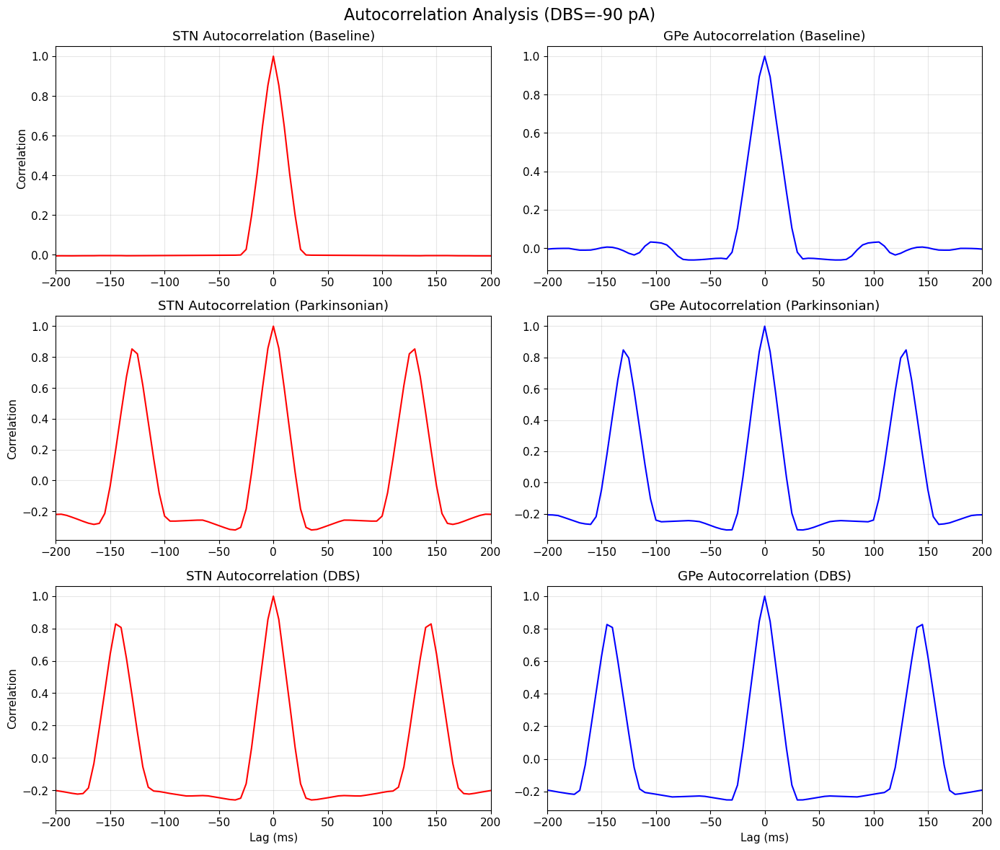


--- Testing amplitude: 90 pA ---

Dec 11 15:06:10 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 15:06:10 NodeManager::prepare_nodes [Info]: 
    Preparing 805 nodes for simulation.

Dec 11 15:06:10 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 805
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 15:06:12 SimulationManager::run [Info]: 
    Simulation finished.


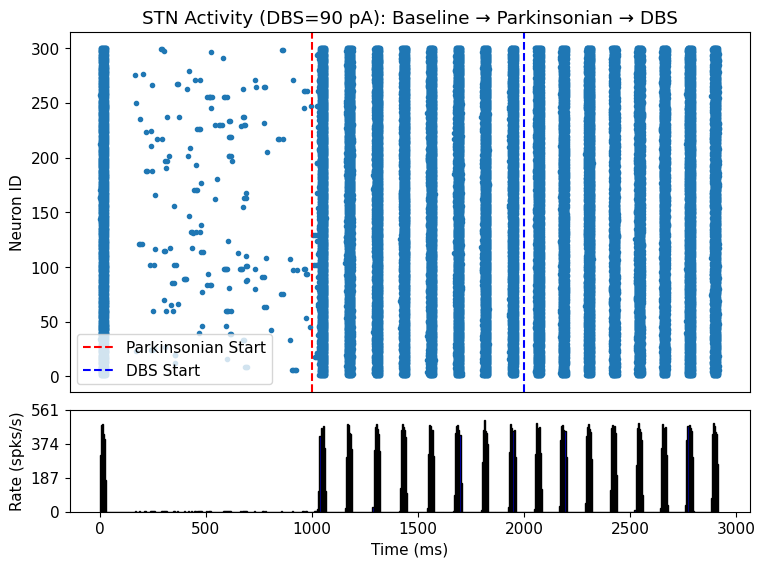

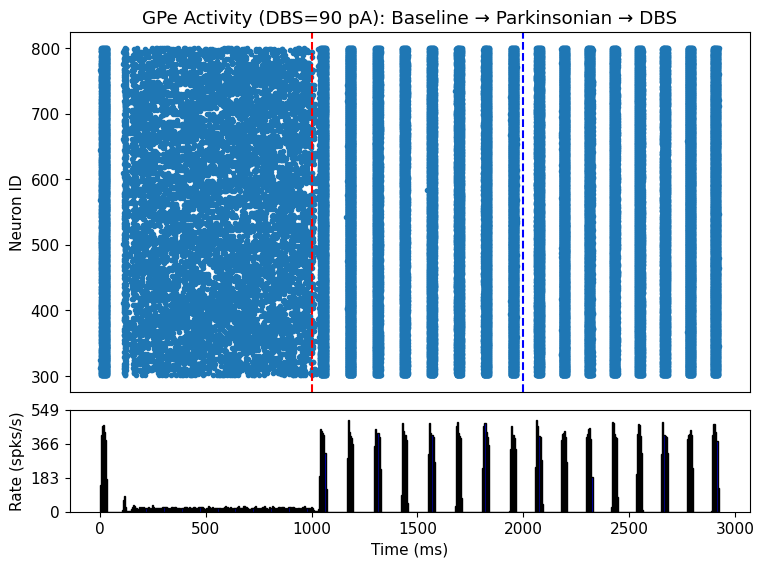

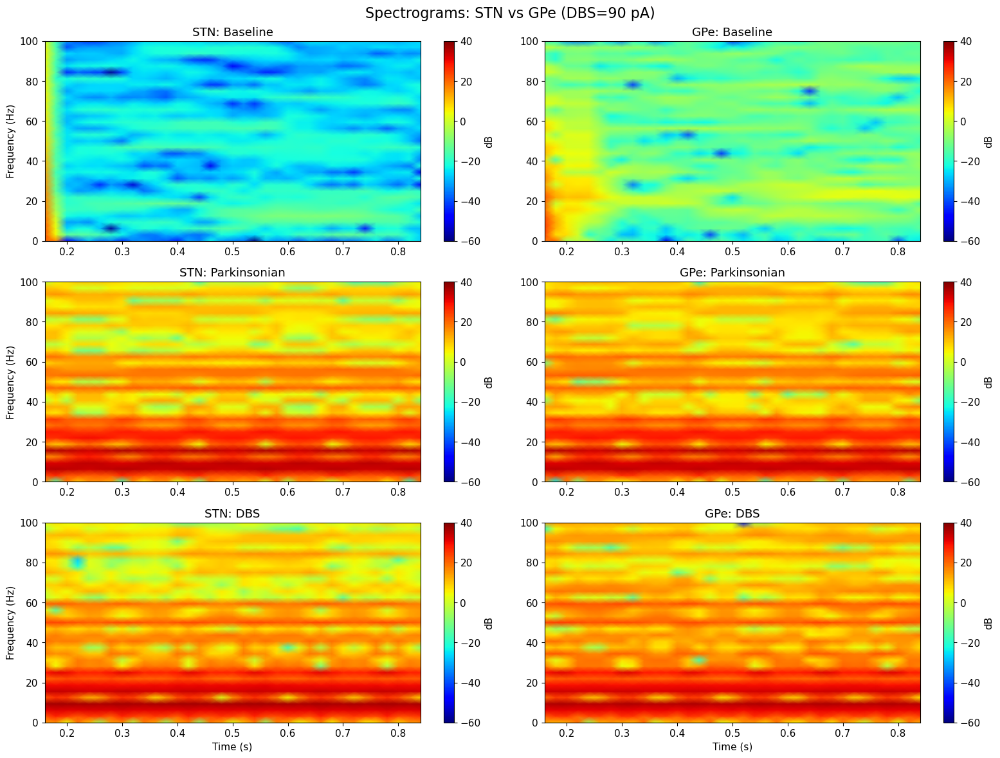

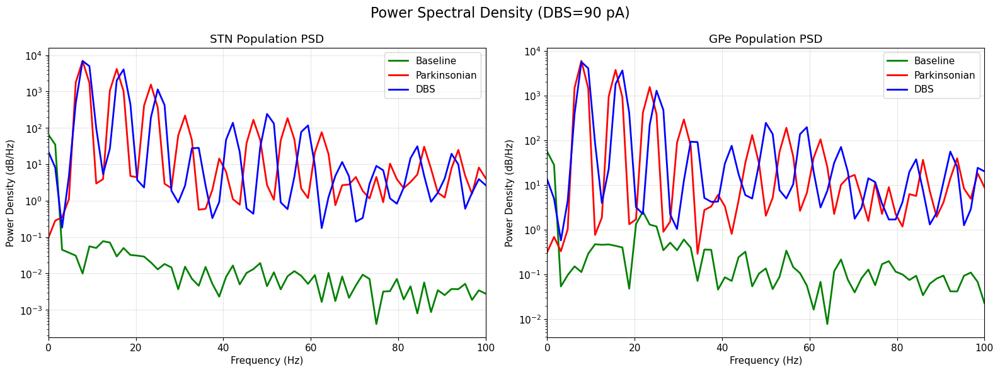

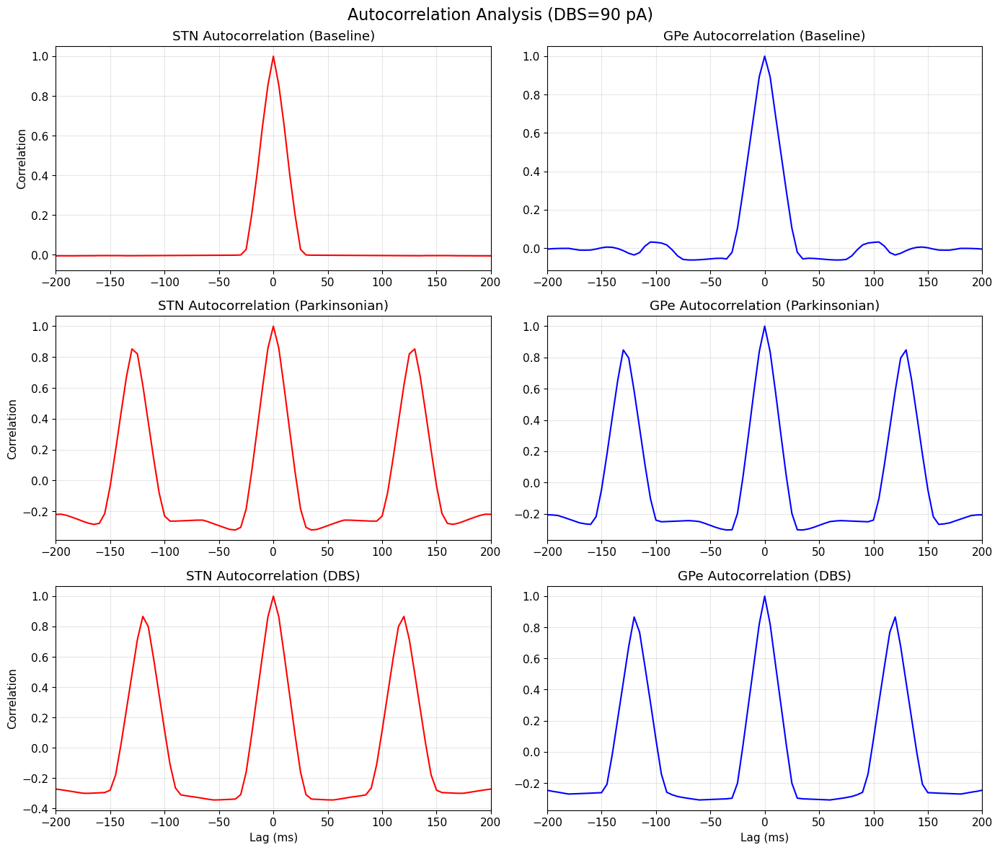


--- Testing amplitude: 300 pA ---

Dec 11 15:06:16 SimulationManager::set_status [Info]: 
    Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 15:06:16 NodeManager::prepare_nodes [Info]: 
    Preparing 805 nodes for simulation.

Dec 11 15:06:16 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 805
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 15:06:17 SimulationManager::run [Info]: 
    Simulation finished.


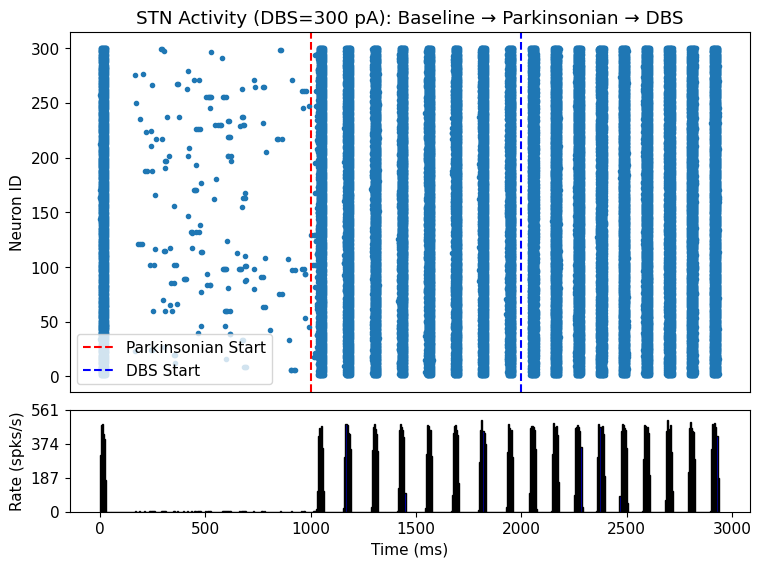

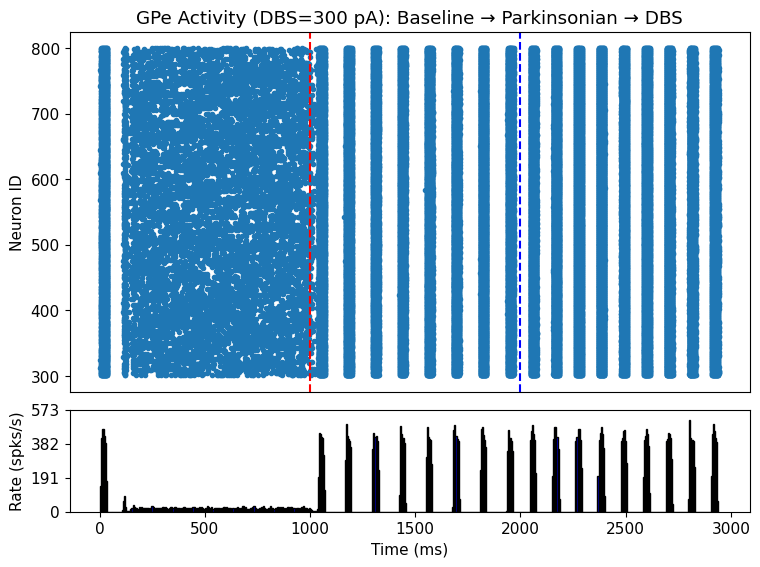

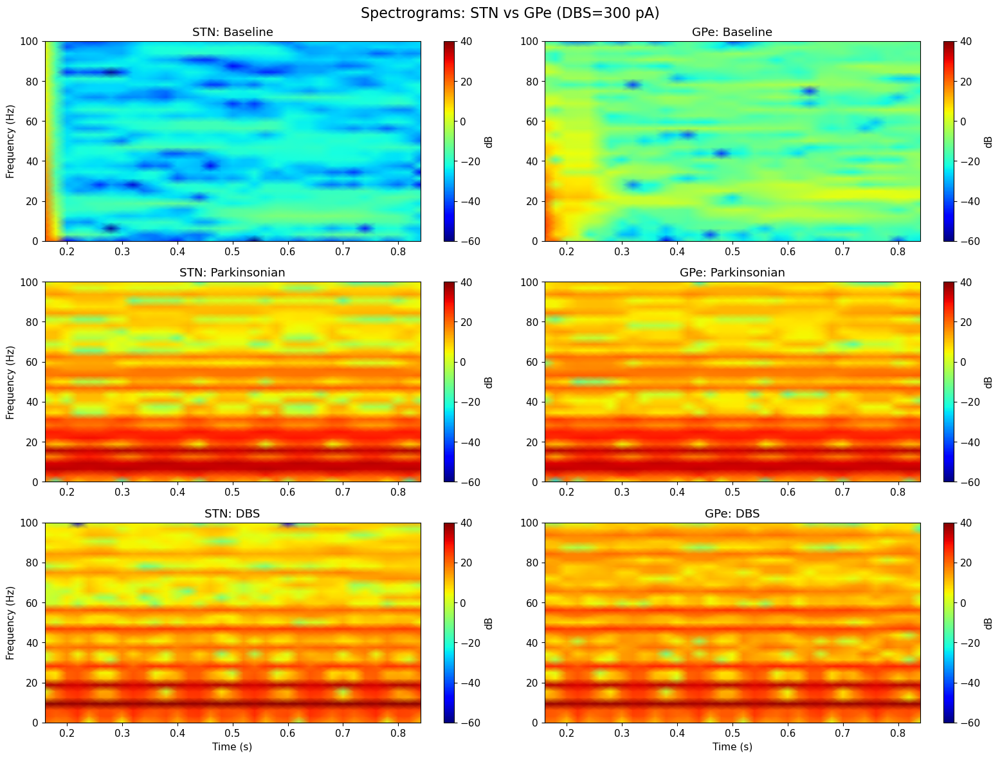

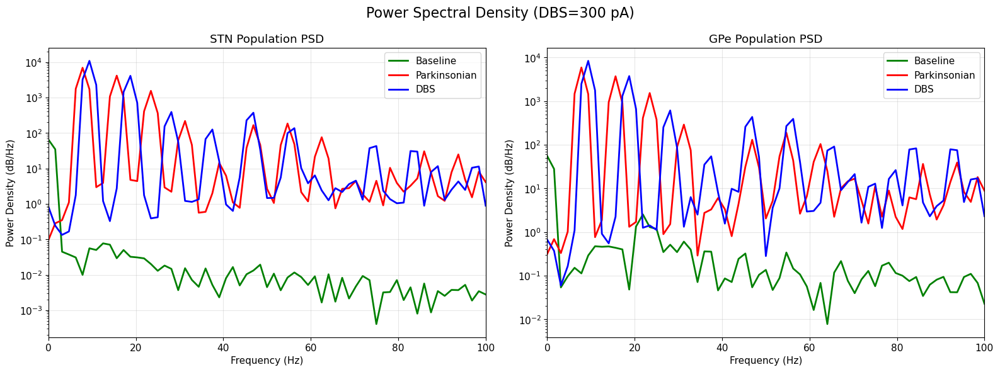

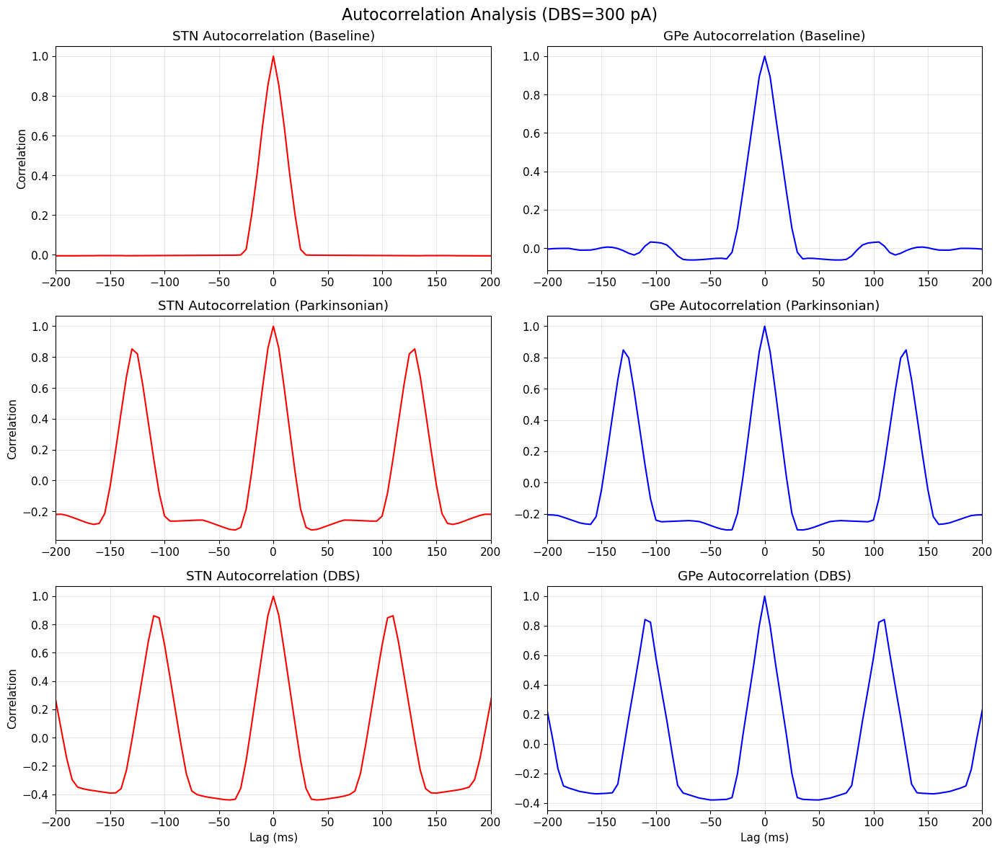

In [29]:
def dbs_amplitude_study(
    amplitudes=[-200, -180, -90, +90, +300], detailed_analysis_threshold=-180.0
):
    for amplitude in amplitudes:
        print(f"--- Testing amplitude: {amplitude} pA ---")

        spike_stn, spike_gpe = run_dbs_simulation(amplitude=amplitude)

        # Basic raster plots for all amplitudes
        plot_dbs_results(spike_stn, spike_gpe, amplitude=amplitude)

        # Detailed spectral analysis for selected amplitudes
        if amplitude > detailed_analysis_threshold:
            complete_spectral_analysis(spike_stn, spike_gpe, amplitude)

        print()  # spacing


dbs_amplitude_study()


## 6. Bonus 2


Dec 11 15:14:34 SimulationManager::set_status [Info]: 
    Simulating for 3000.0 ms...
Temporal resolution changed from 0.1 to 0.1 ms.

Dec 11 15:14:34 NodeManager::prepare_nodes [Info]: 
    Preparing 806 nodes for simulation.

Dec 11 15:14:34 SimulationManager::start_updating_ [Info]: 
    Number of local nodes: 806
    Simulation time (ms): 3000
    Number of OpenMP threads: 1
    Not using MPI

Dec 11 15:14:35 SimulationManager::run [Info]: 
    Simulation finished.


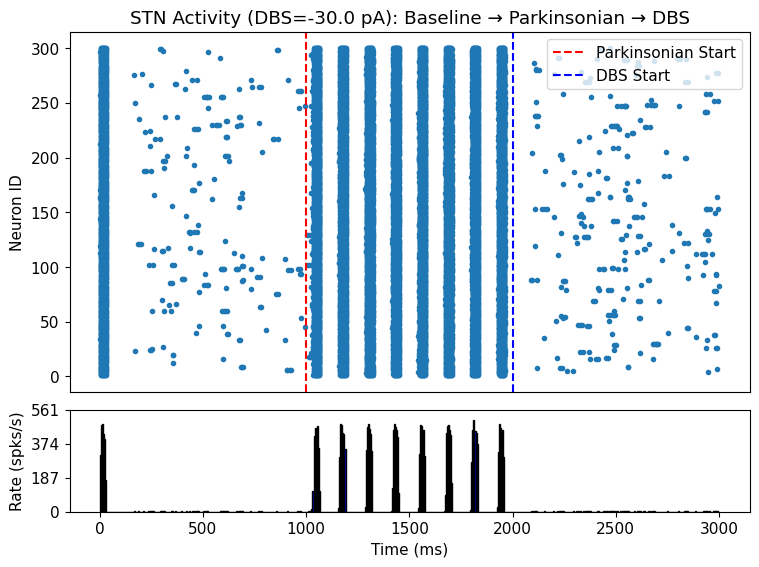

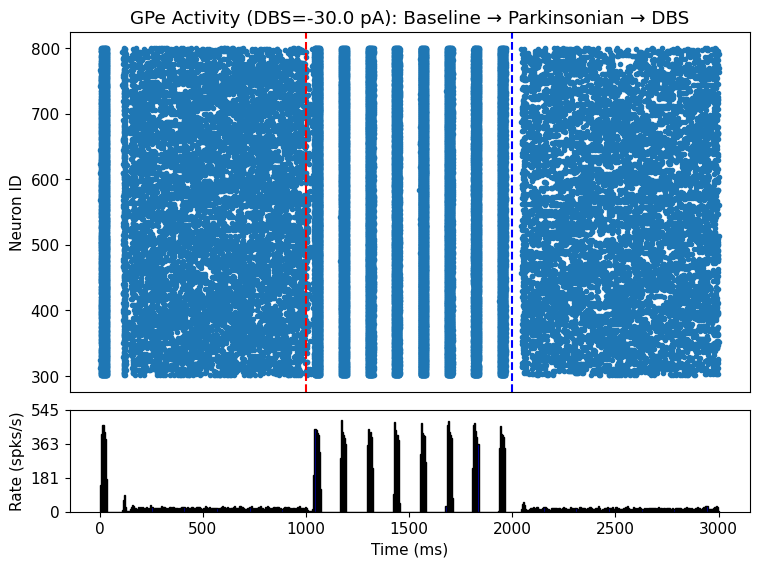

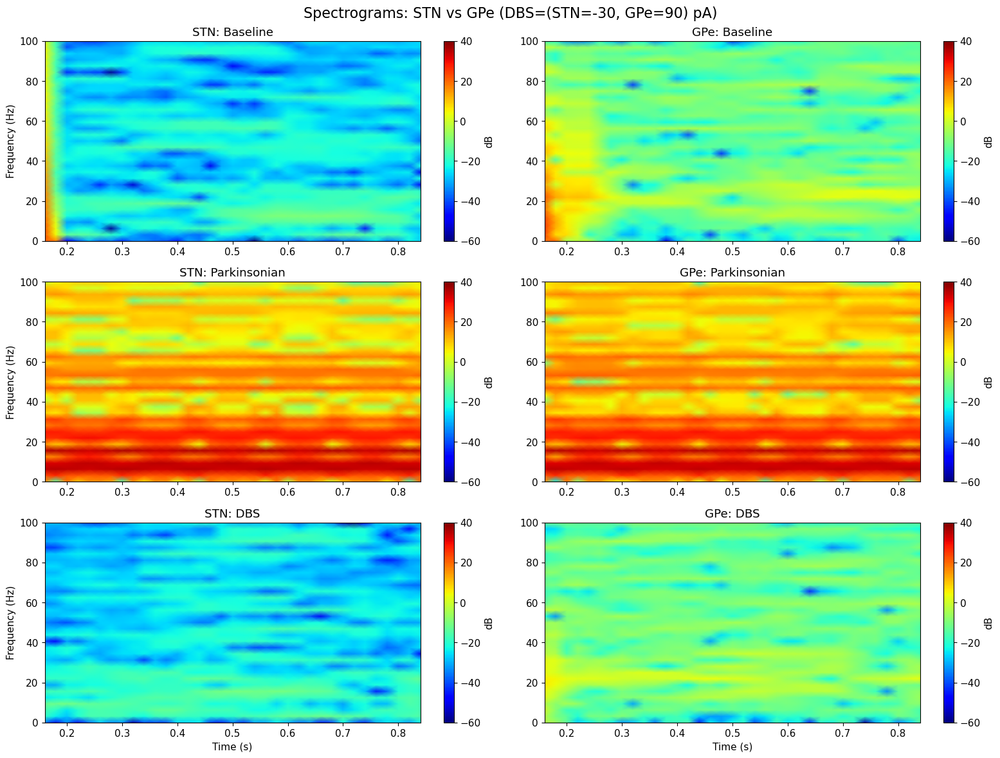

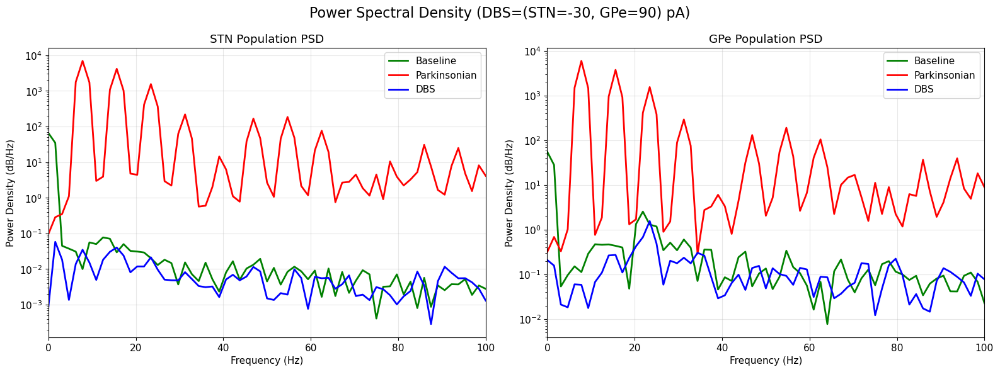

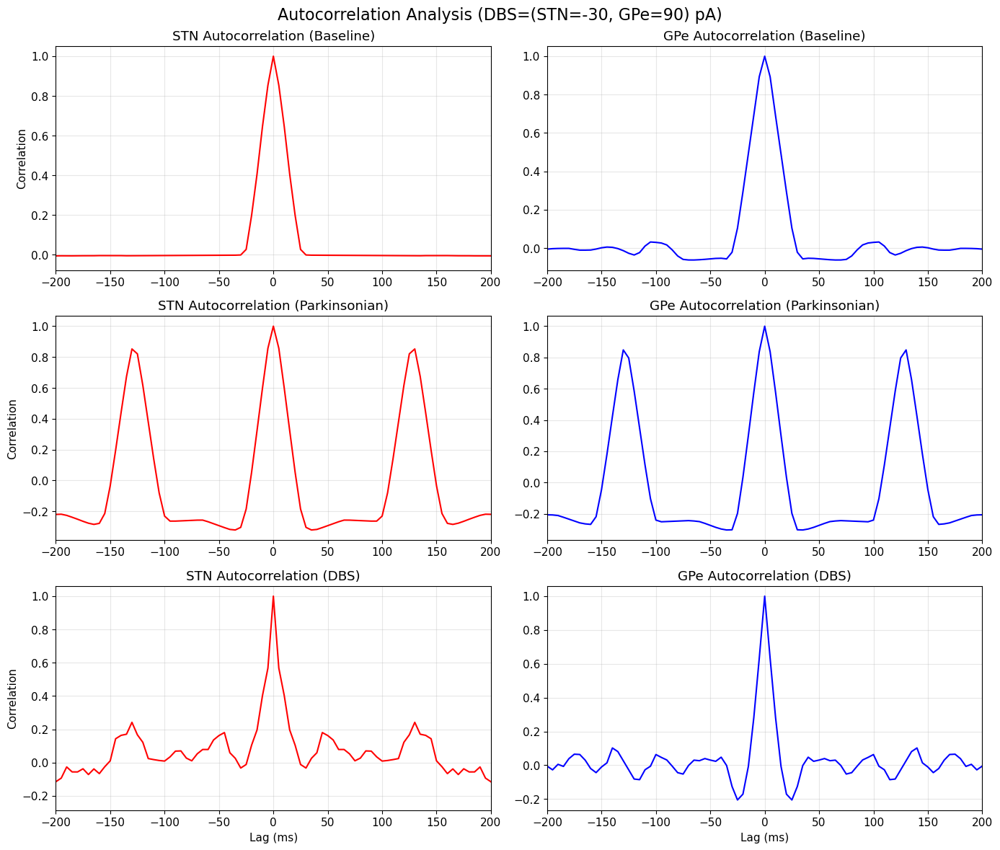

In [30]:
def base_PD_DBS_BONUS2(amplitude):
    stn_pop, gpe_pop = setup_network()

    add_background_noise(stn_pop, gpe_pop)
    # Parkinson state
    gpe_extra_inhib = nest.Create(
        "poisson_generator", params={"rate": 800.0, "start": 1000.0, "stop": 3000.0}
    )
    nest.Connect(gpe_extra_inhib, gpe_pop, syn_spec={"weight": -5.0})

    # DBS
    dbs_generator = nest.Create(
        "dc_generator",
        params={"amplitude": amplitude, "start": 2000.0, "stop": 3000.0},
    )
    nest.Connect(dbs_generator, stn_pop)

    # excite GPe CHANGE HERE
    excite_gpe = nest.Create(
        "dc_generator",
        params={"amplitude": 90.0, "start": 2000.0, "stop": 3000.0},
    )
    nest.Connect(excite_gpe, gpe_pop)

    spike_stn = nest.Create("spike_recorder")
    spike_gpe = nest.Create("spike_recorder")
    nest.Connect(stn_pop, spike_stn)
    nest.Connect(gpe_pop, spike_gpe)

    sim_time = 3000.0
    print(f"Simulating for {sim_time} ms...")
    nest.Simulate(sim_time)
    return spike_stn, spike_gpe


# CHANGE HERE
spike_stn, spike_gpe = base_PD_DBS_BONUS2(amplitude=-30.0)

plot_dbs_results(
    spike_stn, spike_gpe, amplitude=-30.0, pd_start=1000.0, dbs_start=2000.0
)


complete_spectral_analysis(spike_stn, spike_gpe, amplitude="(STN=-30, GPe=90)")


## 7. Summary and Cnclusions

### Key Findings:
1. **Baseline State**: Normal uncorrelated firing patterns in both STN and GPe
2. **Parkinsonian State**: Enhanced oscillations due to reduced GPe inhibition
3. **DBS Treatment**: Current amplitude determines therapeutic effect
4. **Bonus 2 Strategy**: Combined STN inhibition + GPe excitation may provide better results
